Pour afficher le sommaire: Executer les deux premières lignes

In [1]:
%%javascript
$.getScript('https://kmahelona.github.io/ipython_notebook_goodies/ipython_notebook_toc.js')

<IPython.core.display.Javascript object>

<h1 id="tocheading">Sommaire</h1>
<div id="toc"></div>

# Importation

In [4]:
%matplotlib inline

In [36]:
import pandas as pd
import sklearn
import numpy as np
import matplotlib.pyplot as plt
import os
import warnings
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.svm import LinearSVC
from sklearn.metrics import roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score,auc
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_recall_curve
from sklearn.linear_model import SGDClassifier
import plotly.offline as py
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import roc_curve
from bayes_opt import BayesianOptimization
from sklearn.model_selection import KFold,StratifiedKFold
from catboost import CatBoostClassifier, Pool
import shap
#import cufflinks as cf
#cf.go_offline()
import pickle
import gc
import lightgbm as lgb

import _io as io
import base64

from sklearn.metrics import classification_report
warnings.filterwarnings('ignore')

# Affichage

In [6]:
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 500)
pd.options.display.max_seq_items = 2000

In [7]:
pd.options.display.float_format = '{:,.4f}'.format

# Chargement des données client

In [8]:
with open('data/colcat.pickle', 'rb') as f:
    colcat = pickle.load(f)
with open('data/colnum.pickle', 'rb') as f:
    colnum = pickle.load(f)    
with open('data/coldata.pickle', 'rb') as f:    
    coldata = pickle.load(f)
with open('data/colbase.pickle', 'rb') as f:    
    colbase = pickle.load(f)    

In [9]:
data = pd.read_csv('D:/openclassrooms/PROJET 7/data_client_IMP_V2.csv')
print('Data shape: ', data.shape)
data.head()

Data shape:  (278219, 102)


,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_GOODS_PRICE,AMT_ANNUITY,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,CNT_FAM_MEMBERS,REGION_POPULATION_RELATIVE,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,EXT_SOURCE_SUM,EXT_SOURCE_MEAN,LENGTH_CREDIT,INCOME_PER_PERSON,REMAIN_FOR_LIFE,REMAIN_FOR_LIFE_PER_PERSON,CREDIT_INCOME_RATIO,ANNUITY_INCOME_RATIO,YEARS_EMPLOYED,YEARS_BIRTH,EMPLOYED_RATIO,DEF_OBS_30,DEF_OBS_60,RATE_DOC,BUR_TOT_CREDIT,BUR_TOT_CREDIT_DEBT,BUR_TOT_CREDIT_OVERDUE,BUR_TOT_CREDIT_PROLONG,BUR_TOT_ANNUITY,BUR_MIN_DAYS_CREDIT,BUR_MAX_DAYS_OVERDUE,BUR_CNT_ACTIVE_LOAN,BUR_CNT_CLOSED_LOAN,BUR_TOT_ANNUITY_ACTIVE,BUR_TOT_CREDIT_ACTIVE,BUR_CNT_REQUEST_1Y,BUR_BAL_DPD_BAD_1Y,BUR_BAL_DPD_BAD_3Y,CNT_INSURED_ON,CNT_LOANS_APPROVED,CNT_LOANS_CANCELED,CNT_LOANS_REFUSED,CNT_ACTIVE_LOAN,CNT_ACTIVE_REV_LOAN,CNT_ACTIVE_CONS_LOAN,CNT_ACTIVE_CASH_LOAN,TOT_ACTIVE_ANNUITY,MEAN_CNT_PAYMENT_FUTURE,CNT_DPD_60_1Y,CNT_DPD_60_3Y,CNT_LESS_PAYMENT_1Y,CNT_LESS_PAYMENT_3Y,POS_CNT_DPD_60_1Y,POS_CNT_DPD_60_3Y,POS_MEAN_CNT_INSTALMENT_FUTURE,CARD_CNT_DPD_60_1Y,GLOBAL_CNT_DPD_60_1Y,GLOBAL_CNT_DPD_60_3Y,GLOBAL_SUM_ANNUITY,GLOBAL_CREDIT_INCOME_RATIO,GLOBAL_REMAIN_FOR_LIFE,GLOBAL_REMAIN_FOR_LIFE_PER_PERSON,GLOBAL_CNT_ACTIVE_LOAN,EDUCATION_Higher_education,EDUCATION_Incomplete_higher,EDUCATION_Lower_secondary,EDUCATION_Secondary___secondary_special,REALTY_Y,CAR_Y,INCOME_Commercial_associate,INCOME_Pensioner,INCOME_State_servant,INCOME_Working,INCOME_Pensioner_other,FAMILY_Civil_marriage,FAMILY_Married,FAMILY_Separated,FAMILY_Single___not_married,FAMILY_Widow,HOUSING_Co-op_apartment,HOUSING_House___apartment,HOUSING_Municipal_apartment,HOUSING_Office_apartment,HOUSING_Rented_apartment,HOUSING_With_parents,GENDER_M
0,100002,1,M,N,Y,0,"202,500.0000","406,597.5000","351,000.0000","24,700.5000",Working,Secondary / secondary special,Single / not married,House / apartment,1.0000,0.0188,2,2,0.0830,0.2629,0.1394,2.0000,2.0000,2.0000,2.0000,"-1,134.0000",0.6089,0.2030,16.4611,"202,500.0000","177,799.5000","177,799.5000",2.0079,0.1220,1.7452,25.9205,0.0673,1.0000,1.0000,0.0500,"865,055.5650","245,781.0000",0.0000,0.0000,0.0000,"-1,437.0000",0.0000,2.0000,6.0000,0.0000,"481,988.5650",1.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,6.0000,0.0000,0.0000,0.0000,"24,700.5000",0.1220,"177,799.5000","177,799.5000",2.0000,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1
1,100003,0,F,N,N,0,"270,000.0000","1,293,502.5000","1,129,500.0000","35,698.5000",State servant,Higher education,Married,House / apartment,2.0000,0.0035,1,1,0.3113,0.6222,0.5371,1.0000,0.0000,1.0000,0.0000,-828.0000,1.5558,0.5186,36.2341,"135,000.0000","234,301.5000","117,150.7500",4.7908,0.1322,3.2548,45.9315,0.0709,0.0000,0.0000,0.0500,"1,017,400.5000",0.0000,0.0000,0.0000,0.0000,"-2,586.0000",0.0000,1.0000,3.0000,0.0000,"810,000.0000",0.0000,0.0000,0.0000,2.0000,3.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,"35,698.5000",0.1322,"234,301.5000","117,150.7500",1.0000,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0
2,100006,0,F,N,Y,0,"135,000.0000","312,682.5000","297,000.0000","29,686.5000",Working,Secondary / secondary special,Civil marriage,House / apartment,2.0000,0.0080,2,2,0.5076,0.6504,0.5371,2.0000,0.0000,2.0000,0.0000,-617.0000,1.8085,0.6028,10.5328,"67,500.0000","105,313.5000","52,656.7500",2.3162,0.2199,8.3260,52.0685,0.1599,0.0000,0.0000,0.0500,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,5.0000,3.0000,1.0000,2.0000,1.0000,1.0000,0.0000,"42,527.5200",49.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,3.0000,0.0000,0.0000,0.0000,"7

# Préparation des jeux de données

In [10]:
y = data['TARGET']
X_train, X_temp, y_train, y_temp = train_test_split(data[coldata].drop(['TARGET'],axis=1), y, stratify = y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, stratify = y_temp, test_size=0.5, random_state=42)
print('Shape of X_train:',X_train.shape)
print('Shape of X_val:',X_val.shape)
print('Shape of X_test:',X_test.shape)

Shape of X_train: (194753, 93)
Shape of X_val: (41733, 93)
Shape of X_test: (41733, 93)


In [11]:
y_val.value_counts()

0    38250
1     3483
Name: TARGET, dtype: int64

In [12]:
y_train.value_counts()

0    178499
1     16254
Name: TARGET, dtype: int64

In [103]:
X_train.to_csv('D:/openclassrooms/PROJET 7/X_train_impute_non_cr_V2.csv')
X_val.to_csv('D:/openclassrooms/PROJET 7/X_val_impute_non_cr_V2.csv')
X_test.to_csv('D:/openclassrooms/PROJET 7/X_test_impute_non_cr_V2.csv')
y_train.to_csv('D:/openclassrooms/PROJET 7/y_train_impute_non_cr_V2.csv')
y_val.to_csv('D:/openclassrooms/PROJET 7/y_val_impute_non_cr_V2.csv')
y_test.to_csv('D:/openclassrooms/PROJET 7/y_test_impute_non_cr_V2.csv')

# Selection de variables avec un modele simple

In [130]:
model_sk = lgb.LGBMClassifier(boosting_type='gbdt', max_depth=7, learning_rate=0.01, n_estimators= 2000, 
                 class_weight='balanced', subsample=0.9, colsample_bytree= 0.8, n_jobs=-1)

train_features, valid_features, train_y, valid_y = train_test_split(X_train, y_train, test_size = 0.15, random_state = 42)

model_sk.fit(train_features, train_y, early_stopping_rounds=100, eval_set = [(valid_features, valid_y)], eval_metric = 'auc', verbose = 200)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Training until validation scores don't improve for 100 rounds
[200]	valid_0's auc: 0.750281	valid_0's binary_logloss: 0.593359
[400]	valid_0's auc: 0.764535	valid_0's binary_logloss: 0.569684
[600]	valid_0's auc: 0.76996	valid_0's binary_logloss: 0.557271
[800]	valid_0's auc: 0.772795	valid_0's binary_logloss: 0.548953
[1000]	valid_0's auc: 0.774165	valid_0's binary_logloss: 0.542596
[1200]	valid_0's auc: 0.774827	valid_0's binary_logloss: 0.53719
[1400]	valid_0's auc: 0.775057	valid_0's binary_logloss: 0.532404
[1600]	valid_0's auc: 0.775323	valid_0's binary_logloss: 0.527921
Early stopping, best iteration is:
[1573]	valid_0's auc: 0.775369	valid_0's binary_logloss: 0.528465


LGBMClassifier(class_weight='balanced', colsample_bytree=0.8,
               learning_rate=0.01, max_depth=7, n_estimators=2000,
               subsample=0.9)

In [131]:
model_sk.feature_importances_

array([  95,  321, 1301, 1217, 1048,  156,   56,  903,  341, 1931, 1112,
       2345,  184,   23,  151,  257, 1456, 1774,  364, 3495,  498,  486,
        536,  967, 1078, 1090, 2368, 1071,  164,   37,  407, 1268, 1252,
        215,   28,  341, 1061,   57,  418,  652,  356, 1045,  458,    2,
         27,  206, 1207,  221,  718,   56,  258,   49,  136,  728, 1314,
          1,  103,  465,  699,  101,   24,  475,   28,   28,    6, 1169,
        751,  582,  351,  575,  290,   33,   69,  213,   66,  345,   47,
         25,   92,  192,    0,   22,  254,   31,   37,   23,   13,   34,
         57,   77,   18,   24,  565])

In [132]:
feature_imp = pd.DataFrame(sorted(zip(model_sk.feature_importances_, X_train.columns)), columns=['Value','Feature'])
features_df = feature_imp.sort_values(by="Value", ascending=False)
selected_features = list(features_df[features_df['Value']>=50]['Feature'])
# Saving the selected features into pickle file
with open('select_features.pickle','wb') as fp:
    pickle.dump(selected_features, fp)
print('The no. of features selected:',len(selected_features))

The no. of features selected: 70


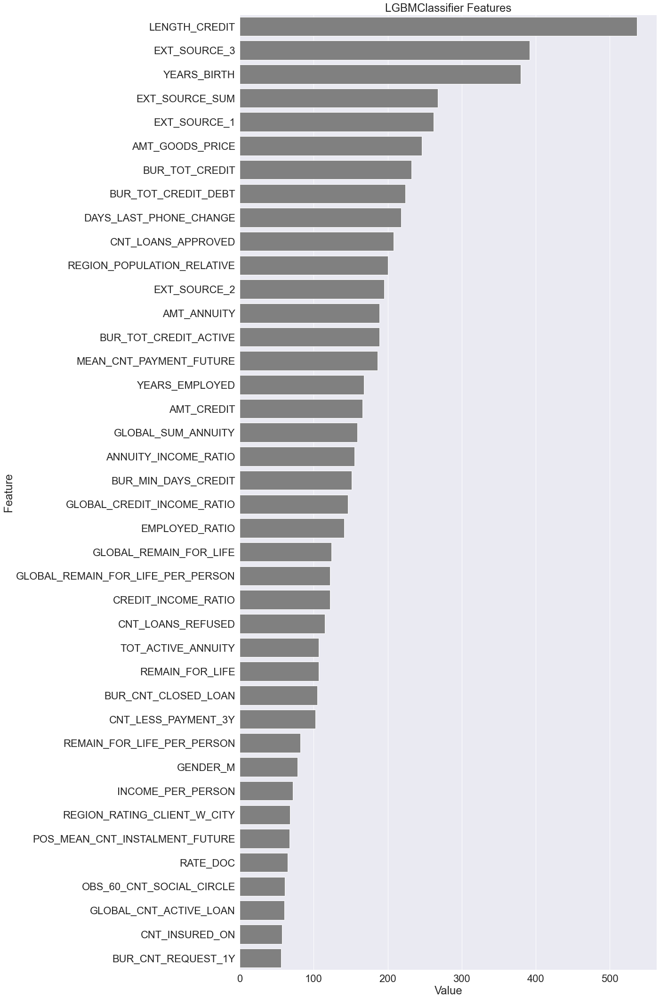

In [148]:
plt.figure(figsize=(20, 30))
sns.set(font_scale = 2)
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False,)[0:40],color ='gray')
plt.title('LGBMClassifier Features')
plt.tight_layout()
#plt.savefig('lgbm_importances-01.png')
plt.show()

In [138]:
selected_features

['LENGTH_CREDIT',
 'YEARS_BIRTH',
 'EXT_SOURCE_3',
 'EXT_SOURCE_1',
 'EXT_SOURCE_SUM',
 'DAYS_LAST_PHONE_CHANGE',
 'MEAN_CNT_PAYMENT_FUTURE',
 'AMT_CREDIT',
 'BUR_TOT_CREDIT',
 'BUR_TOT_CREDIT_DEBT',
 'AMT_GOODS_PRICE',
 'CNT_LOANS_APPROVED',
 'GLOBAL_SUM_ANNUITY',
 'EXT_SOURCE_2',
 'YEARS_EMPLOYED',
 'ANNUITY_INCOME_RATIO',
 'EMPLOYED_RATIO',
 'BUR_MIN_DAYS_CREDIT',
 'AMT_ANNUITY',
 'BUR_TOT_CREDIT_ACTIVE',
 'CREDIT_INCOME_RATIO',
 'REGION_POPULATION_RELATIVE',
 'GLOBAL_CREDIT_INCOME_RATIO',
 'TOT_ACTIVE_ANNUITY',
 'CNT_LOANS_REFUSED',
 'CNT_LESS_PAYMENT_3Y',
 'BUR_CNT_CLOSED_LOAN',
 'GLOBAL_REMAIN_FOR_LIFE',
 'GLOBAL_REMAIN_FOR_LIFE_PER_PERSON',
 'GENDER_M',
 'REMAIN_FOR_LIFE_PER_PERSON',
 'INCOME_PER_PERSON',
 'REMAIN_FOR_LIFE',
 'POS_MEAN_CNT_INSTALMENT_FUTURE',
 'CNT_LESS_PAYMENT_1Y',
 'BUR_CNT_REQUEST_1Y',
 'BUR_CNT_ACTIVE_LOAN',
 'RATE_DOC',
 'EXT_SOURCE_MEAN',
 'BUR_TOT_ANNUITY_ACTIVE',
 'GLOBAL_CNT_ACTIVE_LOAN',
 'CAR_Y',
 'BUR_TOT_ANNUITY',
 'REGION_RATING_CLIENT_W_CITY',
 'A

In [139]:
print(selected_features)

['LENGTH_CREDIT', 'YEARS_BIRTH', 'EXT_SOURCE_3', 'EXT_SOURCE_1', 'EXT_SOURCE_SUM', 'DAYS_LAST_PHONE_CHANGE', 'MEAN_CNT_PAYMENT_FUTURE', 'AMT_CREDIT', 'BUR_TOT_CREDIT', 'BUR_TOT_CREDIT_DEBT', 'AMT_GOODS_PRICE', 'CNT_LOANS_APPROVED', 'GLOBAL_SUM_ANNUITY', 'EXT_SOURCE_2', 'YEARS_EMPLOYED', 'ANNUITY_INCOME_RATIO', 'EMPLOYED_RATIO', 'BUR_MIN_DAYS_CREDIT', 'AMT_ANNUITY', 'BUR_TOT_CREDIT_ACTIVE', 'CREDIT_INCOME_RATIO', 'REGION_POPULATION_RELATIVE', 'GLOBAL_CREDIT_INCOME_RATIO', 'TOT_ACTIVE_ANNUITY', 'CNT_LOANS_REFUSED', 'CNT_LESS_PAYMENT_3Y', 'BUR_CNT_CLOSED_LOAN', 'GLOBAL_REMAIN_FOR_LIFE', 'GLOBAL_REMAIN_FOR_LIFE_PER_PERSON', 'GENDER_M', 'REMAIN_FOR_LIFE_PER_PERSON', 'INCOME_PER_PERSON', 'REMAIN_FOR_LIFE', 'POS_MEAN_CNT_INSTALMENT_FUTURE', 'CNT_LESS_PAYMENT_1Y', 'BUR_CNT_REQUEST_1Y', 'BUR_CNT_ACTIVE_LOAN', 'RATE_DOC', 'EXT_SOURCE_MEAN', 'BUR_TOT_ANNUITY_ACTIVE', 'GLOBAL_CNT_ACTIVE_LOAN', 'CAR_Y', 'BUR_TOT_ANNUITY', 'REGION_RATING_CLIENT_W_CITY', 'AMT_INCOME_TOTAL', 'EDUCATION_Higher_educatio

# Fonction d'affichage

In [17]:
def plot_confusion_matrix(test_y, predicted_y):
    # Confusion matrix
    C = confusion_matrix(test_y, predicted_y)
    
    # Recall matrix
    A = (((C.T)/(C.sum(axis=1))).T)
    
    # Precision matrix
    B = (C/C.sum(axis=0))
    
    plt.figure(figsize=(20,4))
    
    labels = ['Re-paid(0)','Not Re-paid(1)']
    cmap=sns.light_palette("purple")
    plt.subplot(1,3,1)
    sns.heatmap(C, annot=True, cmap=cmap,fmt="d", xticklabels = labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Orignal Class')
    plt.title('Confusion matrix')
    
    plt.subplot(1,3,2)
    sns.heatmap(A, annot=True, cmap=cmap, xticklabels = labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Orignal Class')
    plt.title('Recall matrix')
    
    plt.subplot(1,3,3)
    sns.heatmap(B, annot=True, cmap=cmap, xticklabels = labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Orignal Class')
    plt.title('Precision matrix')
    
    plt.show()
    
def cv_plot(alpha, cv_auc):
    
    fig, ax = plt.subplots()
    ax.plot(np.log10(alpha), cv_auc,c='g')
    for i, txt in enumerate(np.round(cv_auc,3)):
        ax.annotate((alpha[i],str(txt)), (np.log10(alpha[i]),cv_auc[i]))
    plt.grid()
    plt.xticks(np.log10(alpha))
    plt.title("Cross Validation Error for each alpha")
    plt.xlabel("Alpha i's")
    plt.ylabel("Error measure")
    plt.show()

# Modele Catboost

Matrice de poids

In [150]:
weight = np.ones((len(X_train),), dtype=int)
for i in range(len(X_train)):
    if y_train.iloc[i] == 0:
        weight[i] = 1
    else:
        weight[i] = 11

In [151]:
from sklearn.utils import class_weight
cw = list(class_weight.compute_class_weight('balanced',
                                             np.unique(y_train),
                                             y_train))
cw

[0.5455296668328674, 5.990925310692752]

Preparation des jeux de données et de validation

In [152]:
cb_train_data = Pool(X_train[selected_features], label=y_train, feature_names=selected_features, weight=weight)
cb_valid_data = Pool(X_val[selected_features], feature_names=selected_features, label=y_val)
cb_test_data = Pool(X_test[selected_features], feature_names=selected_features, label=y_test)

Recherche des hyperparametres

In [125]:
params = {'depth': [4, 7, 10],
          'learning_rate' : [0.03, 0.1, 0.15],
         'l2_leaf_reg': [1,4,9],
         'iterations': [300]}
clf= CatBoostClassifier( eval_metric='AUC')
grid_search_result = clf.grid_search(params, X=cb_train_data, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


bestTest = 0.7560321211
bestIteration = 299

Metric AUC is not calculated on train by default. To calculate this metric on train, add hints=skip_train~false to metric parameters.
0:	loss: 0.7560321	best: 0.7560321 (0)	total: 12.5s	remaining: 5m 24s

bestTest = 0.7705703258
bestIteration = 299

Metric AUC is not calculated on train by default. To calculate this metric on train, add hints=skip_train~false to metric parameters.
1:	loss: 0.7705703	best: 0.7705703 (1)	total: 24.9s	remaining: 5m 10s

bestTest = 0.7712326976
bestIteration = 297

Metric AUC is not calculated on train by default. To calculate this metric on train, add hints=skip_train~false to metric parameters.
2:	loss: 0.7712327	best: 0.7712327 (2)	total: 37.5s	remaining: 4m 59s

bestTest = 0.7563544511
bestIteration = 298

Metric AUC is not calculated on train by default. To calculate this metric on train, add hints=skip_train~false to metric parameters.
3:	loss: 0.7563545	best: 0.7712327 (2)	total: 49.9s	remaining: 4m 47s


In [126]:
grid_search_result

{'params': {'depth': 4,
  'l2_leaf_reg': 4,
  'iterations': 300,
  'learning_rate': 0.15},
 'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               45

In [153]:
cb = CatBoostClassifier(eval_metric='AUC', depth = 4, l2_leaf_reg = 9, iterations = 300, learning_rate=0.15 )

cb.fit(cb_train_data,eval_set=cb_valid_data,plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.6895037	best: 0.6895037 (0)	total: 124ms	remaining: 37s
1:	test: 0.7087218	best: 0.7087218 (1)	total: 187ms	remaining: 27.8s
2:	test: 0.7156689	best: 0.7156689 (2)	total: 269ms	remaining: 26.6s
3:	test: 0.7215180	best: 0.7215180 (3)	total: 331ms	remaining: 24.5s
4:	test: 0.7233670	best: 0.7233670 (4)	total: 377ms	remaining: 22.2s
5:	test: 0.7280589	best: 0.7280589 (5)	total: 424ms	remaining: 20.8s
6:	test: 0.7284478	best: 0.7284478 (6)	total: 497ms	remaining: 20.8s
7:	test: 0.7321425	best: 0.7321425 (7)	total: 562ms	remaining: 20.5s
8:	test: 0.7355648	best: 0.7355648 (8)	total: 606ms	remaining: 19.6s
9:	test: 0.7378658	best: 0.7378658 (9)	total: 661ms	remaining: 19.2s
10:	test: 0.7396142	best: 0.7396142 (10)	total: 727ms	remaining: 19.1s
11:	test: 0.7408417	best: 0.7408417 (11)	total: 789ms	remaining: 18.9s
12:	test: 0.7417532	best: 0.7417532 (12)	total: 863ms	remaining: 19.1s
13:	test: 0.7432788	best: 0.7432788 (13)	total: 976ms	remaining: 19.9s
14:	test: 0.7451378	best: 0.

117:	test: 0.7720021	best: 0.7720021 (117)	total: 6.39s	remaining: 9.85s
118:	test: 0.7719671	best: 0.7720021 (117)	total: 6.44s	remaining: 9.8s
119:	test: 0.7719842	best: 0.7720021 (117)	total: 6.5s	remaining: 9.75s
120:	test: 0.7721277	best: 0.7721277 (120)	total: 6.54s	remaining: 9.68s
121:	test: 0.7721894	best: 0.7721894 (121)	total: 6.6s	remaining: 9.63s
122:	test: 0.7722968	best: 0.7722968 (122)	total: 6.64s	remaining: 9.56s
123:	test: 0.7724113	best: 0.7724113 (123)	total: 6.7s	remaining: 9.5s
124:	test: 0.7726073	best: 0.7726073 (124)	total: 6.76s	remaining: 9.47s
125:	test: 0.7726770	best: 0.7726770 (125)	total: 6.82s	remaining: 9.41s
126:	test: 0.7727239	best: 0.7727239 (126)	total: 6.87s	remaining: 9.36s
127:	test: 0.7728071	best: 0.7728071 (127)	total: 6.92s	remaining: 9.3s
128:	test: 0.7728258	best: 0.7728258 (128)	total: 7.01s	remaining: 9.29s
129:	test: 0.7727932	best: 0.7728258 (128)	total: 7.08s	remaining: 9.25s
130:	test: 0.7729507	best: 0.7729507 (130)	total: 7.12s	r

231:	test: 0.7773439	best: 0.7773439 (231)	total: 12.1s	remaining: 3.54s
232:	test: 0.7773348	best: 0.7773439 (231)	total: 12.1s	remaining: 3.49s
233:	test: 0.7772925	best: 0.7773439 (231)	total: 12.2s	remaining: 3.44s
234:	test: 0.7773237	best: 0.7773439 (231)	total: 12.3s	remaining: 3.39s
235:	test: 0.7773150	best: 0.7773439 (231)	total: 12.3s	remaining: 3.35s
236:	test: 0.7772704	best: 0.7773439 (231)	total: 12.4s	remaining: 3.3s
237:	test: 0.7773279	best: 0.7773439 (231)	total: 12.5s	remaining: 3.26s
238:	test: 0.7773815	best: 0.7773815 (238)	total: 12.6s	remaining: 3.21s
239:	test: 0.7774506	best: 0.7774506 (239)	total: 12.6s	remaining: 3.15s
240:	test: 0.7774568	best: 0.7774568 (240)	total: 12.7s	remaining: 3.1s
241:	test: 0.7774757	best: 0.7774757 (241)	total: 12.7s	remaining: 3.05s
242:	test: 0.7775092	best: 0.7775092 (242)	total: 12.8s	remaining: 2.99s
243:	test: 0.7774804	best: 0.7775092 (242)	total: 12.8s	remaining: 2.94s
244:	test: 0.7775184	best: 0.7775184 (244)	total: 12.

## Validation croisée

In [154]:
cb.get_params()

{'iterations': 300,
 'learning_rate': 0.15,
 'depth': 4,
 'l2_leaf_reg': 9,
 'eval_metric': 'AUC'}

In [181]:
def print_cv_summary(cv_data):
    cv_data.head(10)

    best_value = cv_data['test-AUC-mean'].max()
    best_iter = cv_data['test-AUC-mean'].values.argmax()

    print('Best validation AUC score : {:.4f}±{:.4f} on step {}'.format(
        best_value,
        cv_data['test-AUC-std'][best_iter],
        best_iter)
    )

In [190]:
from catboost import cv

param = {'iterations': 300,
 'learning_rate': 0.15,
 'depth': 4,
 'l2_leaf_reg': 9,
 'eval_metric': 'AUC',
 'loss_function': 'Logloss'}

cv_data = cv(
    params = param,
    pool = cb_train_data,
    fold_count=5,
    shuffle=True,
    partition_random_seed=0,
    plot=True,
    stratified=True,
    verbose=False
)

print_cv_summary(cv_data)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Best validation AUC score : 0.7768±0.0034 on step 299


In [191]:
print_cv_summary(cv_data)

Best validation AUC score : 0.7768±0.0034 on step 299


In [192]:
cv_data

,iterations,test-AUC-mean,test-AUC-std,test-Logloss-mean,test-Logloss-std,train-Logloss-mean,train-Logloss-std
0,0,0.6838,0.0042,0.6770,0.0003,0.6769,0.0002
1,1,0.7032,0.0051,0.6639,0.0012,0.6636,0.0009
2,2,0.7090,0.0051,0.6536,0.0017,0.6531,0.0012
3,3,0.7153,0.0055,0.6447,0.0017,0.6442,0.0009
4,4,0.7176,0.0060,0.6379,0.0019,0.6373,0.0007
5,5,0.7203,0.0061,0.6326,0.0019,0.6320,0.0004
6,6,0.7234,0.0055,0.6282,0.0022,0.6275,0.0005
7,7,0.7263,0.0059,0.6246,0.0022,0.6237,0.0005
8,8,0.7280,0.0062,0.6215,0.0026,0.6205,0.0005
9,9,0.7312,0.0055,0.6185,0.0022,0.6176,0.0004


In [202]:
def auc(m, train, test): 
    return (metrics.roc_auc_score(y_train,m.predict_proba(train)[:,1]),
                            metrics.roc_auc_score(y_test,m.predict_proba(test)[:,1]))

In [204]:
auc(cb,X_train[selected_features],X_test[selected_features])

(0.8034956811385368, 0.7754347671885292)

In [217]:
auc_train=metrics.roc_auc_score(y_train,cb.predict_proba(X_train[selected_features])[:,1])
auc_valid = metrics.roc_auc_score(y_val,cb.predict_proba(X_val[selected_features])[:,1])
auc_test = metrics.roc_auc_score(y_test,cb.predict_proba(X_test[selected_features])[:,1])

In [222]:
print('The Train AUC score is {0}'.format(auc_train))
print('The Valid AUC score is {0}'.format(auc_valid))
print('The Test AUC score is {0}'.format(auc_test))

The Train AUC score is 0.8034956811385368
The Valid AUC score is 0.7792992968648843
The Test AUC score is 0.7754347671885292


In [223]:
with open('model_cb_imp_V2.pkl','wb') as fp:
    pickle.dump(cb, fp)

## Feature importance

In [155]:
feature_importance_cb = cb.get_feature_importance(data=None,
                       
                       prettified=True,
                       thread_count=-1,
                       verbose=False)

In [156]:
feature_importance_cb

,Feature Id,Importances
0,EXT_SOURCE_3,14.6343
1,LENGTH_CREDIT,9.1833
2,EXT_SOURCE_SUM,7.7465
3,EXT_SOURCE_MEAN,7.1241
4,YEARS_BIRTH,4.4146
5,EXT_SOURCE_1,3.6796
6,AMT_GOODS_PRICE,3.1288
7,CNT_LOANS_APPROVED,2.9480
8,MEAN_CNT_PAYMENT_FUTURE,2.6861
9,GENDER_M,2.5208


Feature importance

In [157]:
feature_importance = cb.get_feature_importance(data=cb_train_data,
                       #type = 'ShapValues',
                       prettified=True,
                       thread_count=-1,
                       verbose=False)

In [158]:
feature_importance

,Feature Id,Importances
0,EXT_SOURCE_3,14.6343
1,LENGTH_CREDIT,9.1833
2,EXT_SOURCE_SUM,7.7465
3,EXT_SOURCE_MEAN,7.1241
4,YEARS_BIRTH,4.4146
5,EXT_SOURCE_1,3.6796
6,AMT_GOODS_PRICE,3.1288
7,CNT_LOANS_APPROVED,2.9480
8,MEAN_CNT_PAYMENT_FUTURE,2.6861
9,GENDER_M,2.5208


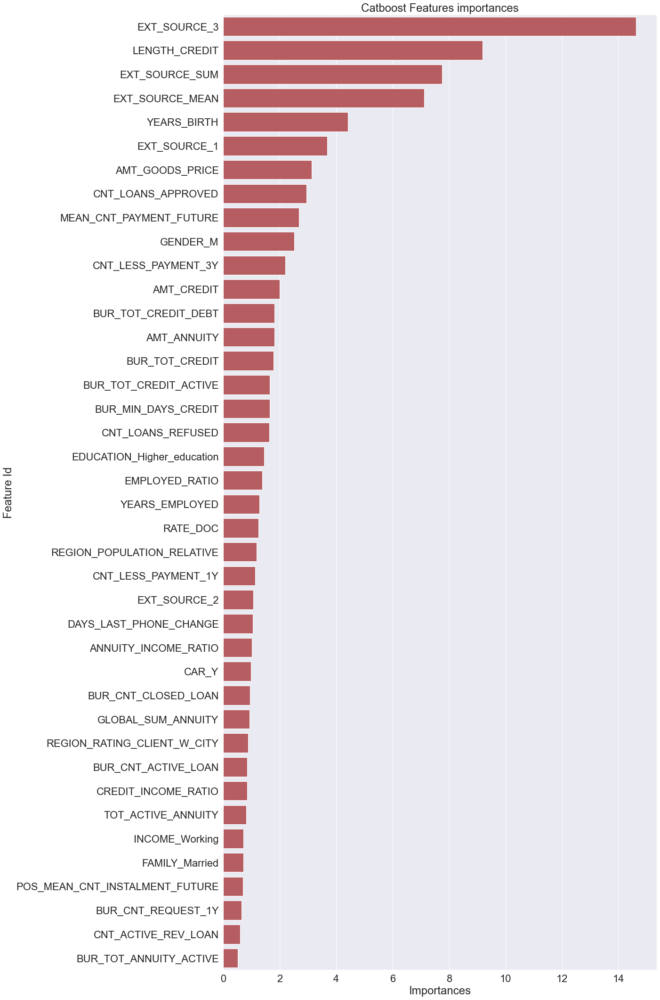

In [161]:

plt.figure(figsize=(20, 30))
sns.set(font_scale = 2)
sns.barplot(x="Importances", y="Feature Id", data=feature_importance[0:40],color ='r')
plt.title('Catboost Features importances')
plt.tight_layout()
#plt.savefig('lgbm_importances-01.png')
plt.show()
sns.set(font_scale = 1)

## Evaluation du modèle

### ROC AUC

In [225]:
from catboost.utils import get_roc_curve
curve = get_roc_curve(cb, cb_test_data)
(fpr, tpr, thresholds) = curve
roc_auc = sklearn.metrics.auc(fpr, tpr)

In [226]:
roc_auc

0.7754347671885291

<Figure size 432x288 with 0 Axes>

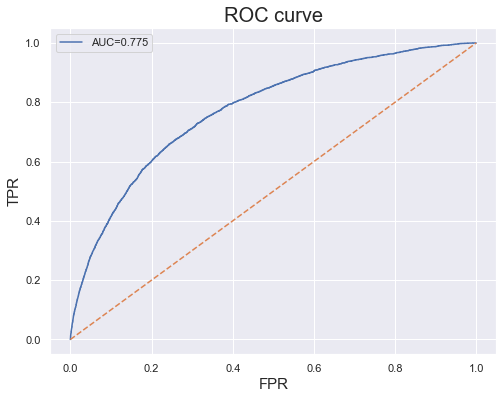

In [227]:
sns.set(font_scale = 1)
plt.clf()
plt.figure(figsize=(8,6))
plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], linestyle='--')
plt.title('ROC curve', fontsize = 20)
plt.xlabel('FPR', fontsize=15)
plt.ylabel('TPR', fontsize=15)
plt.legend(["AUC=%.3f"%roc_auc])
plt.show()

In [228]:
y_pred_cb = cb.predict(X_test[selected_features])

In [229]:
y_pred_prob_cb = cb.predict_proba(X_test[selected_features])[:,1]

Area Under Curve: 0.27


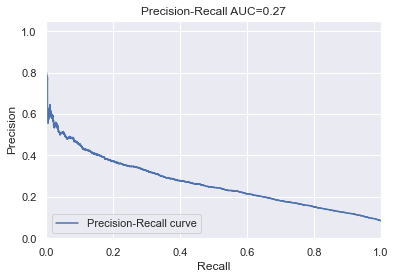

In [230]:
# Compute Precision-Recall and plot curve
precision, recall, thresholds = precision_recall_curve(y_test, y_pred_prob_cb)
area = metrics.auc(recall, precision)
print("Area Under Curve: %0.2f" % area)

plt.clf()
plt.plot(recall, precision, label='Precision-Recall curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall AUC=%0.2f' % area)
plt.legend(loc="lower left")
plt.show()

In [231]:
print('The test AUC score is :', roc_auc_score(y_test, y_pred_prob_cb))
print('The percentage of misclassified points {:05.2f}% :'.format(
    (1-accuracy_score(y_test, y_pred_cb))*100))

The test AUC score is : 0.7754347671885292
The percentage of misclassified points 28.42% :


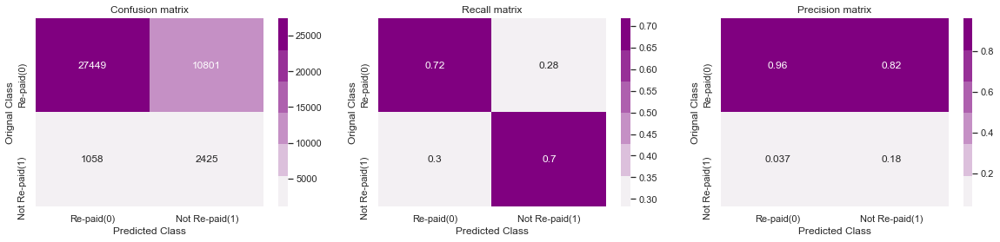

In [232]:
plot_confusion_matrix(y_test,y_pred_cb)

In [148]:
    y_pred_prob = cb.predict_proba(X_val[selected_features])[:,1]
    roc_auc_score(y_val,y_pred_prob)
    

0.7792992968648843

In [234]:
print(classification_report(y_test,y_pred_cb))

              precision    recall  f1-score   support

           0       0.96      0.72      0.82     38250
           1       0.18      0.70      0.29      3483

    accuracy                           0.72     41733
   macro avg       0.57      0.71      0.56     41733
weighted avg       0.90      0.72      0.78     41733



In [236]:
y_pred_prob = cb.predict_proba(X_test[selected_features])[:,1]
pred=pd.DataFrame({'y':y_test,'proba':y_pred_prob})

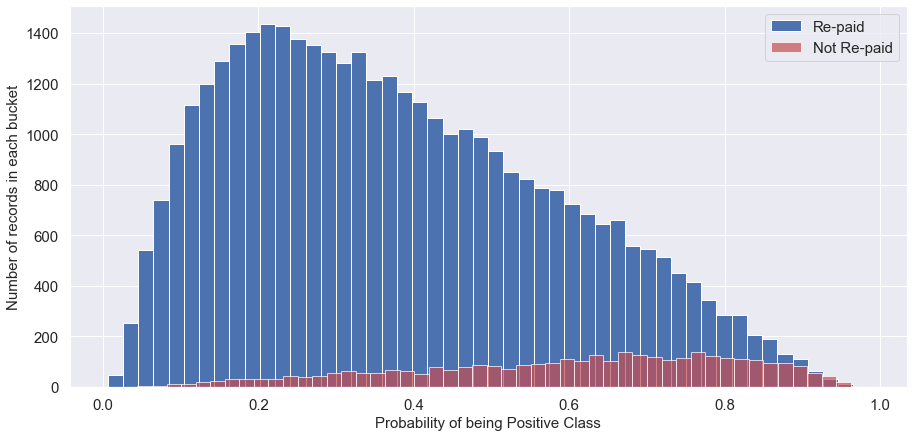

In [237]:
plt.figure(figsize=(15,7))
plt.hist(pred['proba'].loc[pred['y']==0], bins=50, label='Re-paid')
plt.hist(pred['proba'].loc[pred['y']==1], bins=50, label='Not Re-paid', alpha=0.7, color='r')
plt.xlabel('Probability of being Positive Class', fontsize=15)
plt.ylabel('Number of records in each bucket', fontsize=15)
plt.legend(fontsize=15)
plt.tick_params(axis='both', labelsize=15, pad=5)
plt.show() 

SHARP

In [239]:
feature_importance_shap = cb.get_feature_importance(data=cb_test_data,
                       type = 'ShapValues',
                       prettified=True,
                       thread_count=-1,
                       verbose=False)

In [240]:
feature_importance_shap

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70
0,0.0493,0.1585,0.1836,0.1019,-0.4412,-0.0359,-0.0332,0.0808,0.0016,0.0099,0.0124,-0.1976,0.0127,0.0076,0.0585,0.0439,0.0611,0.0034,-0.0017,-0.0086,0.0566,-0.0525,-0.0026,0.0093,-0.0795,-0.0804,0.0585,0.0026,-0.0050,-0.1253,0.0014,-0.0063,0.0025,0.0008,-0.0359,-0.0143,0.0054,0.0151,-0.2927,0.0070,0.0103,0.0591,0.0003,-0.0146,0.0033,0.0574,0.1252,-0.0106,0.0792,0.0024,-0.0027,0.0130,0.0077,0.0554,-0.0030,-0.0087,0.0025,-0.0025,0.0196,-0.0019,-0.0024,0.0001,0.0032,0.0010,-0.0013,-0.0006,0.0326,0.0007,-0.0026,-0.0035,-0.0041
1,-0.1101,-0.3749,-0.0884,-0.1426,0.0704,0.0846,-0.1116,0.1661,0.1229,-0.0445,-0.3147,0.0540,0.0156,-0.0187,0.0566,0.0660,0.0847,0.0689,0.0673,-0.0078,0.0287,-0.0553,-0.0001,0.0231,-0.0789,-0.0929,0.0543,0.0015,-0.0156,-0.0989,-0.0008,0.0067,0.0064,0.0030,-0.0393,-0.0062,-0.0249,0.0137,0.0189,-0.0027,-0.0138,0.0591,0.0022,0.0429,0.0033,0.0586,-0.0378,-0.0073,0.0521,0.0027,-0.0033,-0.0699,-0.0125,0.0536,-0.0123,-0.0098,-0.0010,-0.0035,0.0196,-0.0034,-0.0024,0.0001,0.0029,0.0008,-0.0013,0.0019,-0.0018,0.0009,0.0011,0.0112,-0.0041
2,-0.1322,-0.2393,-0.0980,0.0093,-0.1617,-0.0094,0.0816,0.1405,0.1414,-0.0561,-0.3172,-0.0762,0.0154,0.0114,-0.0289,0.0265,0.0084,0.0533,0.0744,-0.0196,0.0016,0.0158,0.0049,-0.0068,-0.0805,-0.0987,0.0532,0.0000,-0.0112,-0.1607,0.0272,-0.0122,0.0136,-0.0355,-0.0371,-0.0109,-0.0343,0.0129,-0.1188,-0.0047,-0.0130,-0.0844,0.0009,-0.0113,-0.0059,0.0464,-0.0416,0.0746,-0.0658,-0.0020,-0.0038,0.0020,-0.0097,-0.0699,0.0160,0.0151,-0.0011,0.0177,0.0105,-0.0022,-0.0027,0.0001,0.0029,0.0007,-0.0013,-0.0011,-0.0018,0.0010,-0.0102,-0.0019,-0.0041
3,0.1430,-0.1036,-0.0846,-0.1716,-0.3552,0.0820,-0.0491,0.0429,0.1514,-0.0549,0.2538,0.2190,0.0099,0.0006,0.0578,0.0217,0.0611,0.0627,-0.0084,-0.0095,0.0018,0.0471,0.0024,0.0109,-0.0842,-0.0968,0.0556,0.0013,-0.0041,0.2662,0.0022,0.0197,-0.0019,0.0073,-0.0392,-0.0084,-0.0231,0.0111,-0.2002,0.0005,-0.0201,0.0432,0.0010,-0.0072,-0.0018,0.0520,-0.0400,-0.0147,0.1107,0.0105,-0.0039,0.0067,-0.0082,0.0488,0.0025,-0.0081,0.0024,0.0124,0.0137,-0.0020,-0.0032,0.0015,0.0032,0.0008,-0.0013,-0.0011,-0.0022,0.0009,0.0002,-0.0019,-0.0041
4,-0.1187,-0.0481,-0.4060,0.0236,0.2956,-0.0788,-0.1842,0.0372,0.0434,-0.0090,-0.0816,-0.0572,0.0071,-0.0330,-0.1172,0.0689,-0.1262,0.0637,-0.0603,-0.0127,0.0095,0.0145,0.0027,-0.0483,-0.0782,0.3044,0.0545,0.0040,-0.0144,-0.1631,0.0084,0.0051,0.0072,-0.0117,-0.0489,-0.0168,-0.0283,0.0117,0.1257,0.0109,-0.0138,0.0540,0.0076,-0.0117,0.0185,0.0464,-0.0459,-0.0103,0.1026,-0.0019,-0.0033,0.0088,0.0057,-0.0640,-0.0030,-0.0067,0.0025,0.0011,-0.1103,-0.0017,-0.0021,0.0001,0.0019,0.0009,-0.0004,0.0003,-0.0013,0.0008,-0.0102,-0.0019,-0.0041
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41728,0.0997,0.1184,0.5721,-0.2573,-0.5001,-0.0611,-0.0581,0.1610,-0.1182,0.2241,-0.2326,0.0737,0.0457,0.0016,-0.1834,-0.1097,-0.1258,-0.0318,0.0966,-0.1257,-0.0551,0.0422,0.0103,0.0069,-0.0969,-0.0861,-0.0483,-0.0354,0.0057,0.2224,-0.0007,0.0255,-0.0120,0.0170,-0.0467,0.0499,0.0579,0.0097,-0.3347,0.0019,0.0430,0.0640,-0.0532,-0.1964,0.0049,-0.2145,-0.0169,-0.0087,0.0881,0.0024,-0.0024,-0.0221,0.0025,0.0369,-0.0077,-0.0085,-0.0014,-0.0034,0.0132,-0.0019,-0.0019,-0.0033,0.0022,0.0025,-0.0009,-0.0006,-0.0010,0.0006,0.0115,-0.0025,-0.0041
41729,-0.0721,0.0372,-0.0857,-0.0569,0.4036,-0.0251,-0.0476,0.1598,0.0866,-0.0507,-0.2859,0.0628,0.0300,0.0766,-0.0993,0.0402,-0.0526,0.0762,0.0832,-0.0120,0.0267,-0.0216,0.0018,0.0106,-0.0935,-0.0954,0.0515,-0.0004,-0.0063,-0.1421,-0.0104,-0.0063,-0.0037,0.0093,-0.0427,-0.0070,-0.0280,0.0143,0.4

# Etude du Modele LightGBM

Les variables ne sont pas centrées réduites.

## Creation de la matrice de poids

In [18]:
weight = np.ones((len(X_train),), dtype=int)
for i in range(len(X_train)):
    if y_train.iloc[i] == 0:
        weight[i] = 1
    else:
        weight[i] = 11

In [19]:
weight.shape

(194753,)

## Creation des dataset lightgbm train et valid

In [20]:
train_data = lgb.Dataset(
    X_train[selected_features], label=y_train, weight=weight)
valid_data = lgb.Dataset(X_val[selected_features], label=y_val)

## Recherche des meilleurs parametres

Recherche du meilleur max_depth

In [21]:
cv_auc_score = []

max_depth = [3, 5, 7, 10, 15, 20, 25]
for i in max_depth:
    print("i:",i)
    params = {'boosting_type': 'gbdt',
              'max_depth': i,
              'objective': 'binary',
              'nthread': 5,
              'num_leaves': 8,
              'learning_rate': 0.05,
              'max_bin': 512,
              'subsample_for_bin': 200,
              'subsample': 0.7,
              'subsample_freq': 1,
              'colsample_bytree': 0.8,
              'reg_alpha': 0.0,
              'reg_lambda': 0.0,
              'min_split_gain': 0.5,
              'min_child_weight': 1,
              'min_child_samples': 10,
              'scale_pos_weight': 1,
              'num_class': 1,
              'metric': 'auc'
              }
    lgbm = lgb.train(params,
                 train_data,
                 2500,
                 valid_sets=valid_data,
                 early_stopping_rounds=100,
                 verbose_eval=10
                 )
    print("i:",i)
    y_pred_prob = lgbm.predict(X_val[selected_features])
    cv_auc_score.append(roc_auc_score(y_val, y_pred_prob))
    print('For  max_depth {0} and some other parameters, cross validation AUC score {1}'.format(
    i, roc_auc_score(y_val, y_pred_prob)))
print('The optimal  max_depth: ', max_depth[np.argmax(cv_auc_score)])

i: 3
[LightGBM] [Warning] Using too small ``bin_construct_sample_cnt`` may encounter unexpected errors and poor accuracy.
[LightGBM] [Info] Number of positive: 16254, number of negative: 178499
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.035873 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1852
[LightGBM] [Info] Number of data points in the train set: 194753, number of used features: 69
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500413 -> initscore=0.001651
[LightGBM] [Info] Start training from score 0.001651
Training until validation scores don't improve for 100 rounds
[10]	valid_0's auc: 0.724401
[20]	valid_0's auc: 0.728361
[30]	valid_0's auc: 0.733257
[40]	valid_0's auc: 0.739528
[50]	valid_0's auc: 0.745293
[60]	valid_0's auc: 0.74853
[70]	valid_0's auc: 0.751197
[80]	valid_0's auc: 0.753404
[90]	valid_0's auc: 0.75

[930]	valid_0's auc: 0.77747
[940]	valid_0's auc: 0.777404
[950]	valid_0's auc: 0.77741
[960]	valid_0's auc: 0.777401
[970]	valid_0's auc: 0.777402
[980]	valid_0's auc: 0.777353
[990]	valid_0's auc: 0.777382
[1000]	valid_0's auc: 0.777347
[1010]	valid_0's auc: 0.777451
[1020]	valid_0's auc: 0.777462
Early stopping, best iteration is:
[929]	valid_0's auc: 0.777514
i: 5
For  max_depth 5 and some other parameters, cross validation AUC score 0.777514298206602
i: 7
[LightGBM] [Info] Number of positive: 16254, number of negative: 178499
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.033884 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1852
[LightGBM] [Info] Number of data points in the train set: 194753, number of used features: 69
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500413 -> initscore=0.001651
[LightGBM] [Info] Start tra

[990]	valid_0's auc: 0.777631
[1000]	valid_0's auc: 0.777697
[1010]	valid_0's auc: 0.777668
[1020]	valid_0's auc: 0.777606
[1030]	valid_0's auc: 0.777676
[1040]	valid_0's auc: 0.777729
[1050]	valid_0's auc: 0.777728
[1060]	valid_0's auc: 0.777591
[1070]	valid_0's auc: 0.777571
[1080]	valid_0's auc: 0.777503
[1090]	valid_0's auc: 0.77752
[1100]	valid_0's auc: 0.77756
[1110]	valid_0's auc: 0.777505
[1120]	valid_0's auc: 0.77741
[1130]	valid_0's auc: 0.777427
[1140]	valid_0's auc: 0.777414
Early stopping, best iteration is:
[1043]	valid_0's auc: 0.777773
i: 10
For  max_depth 10 and some other parameters, cross validation AUC score 0.7777727261638696
i: 15
[LightGBM] [Info] Number of positive: 16254, number of negative: 178499
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.035697 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1852
[Lig

[920]	valid_0's auc: 0.777495
[930]	valid_0's auc: 0.777505
[940]	valid_0's auc: 0.777443
[950]	valid_0's auc: 0.777502
[960]	valid_0's auc: 0.777488
[970]	valid_0's auc: 0.777579
[980]	valid_0's auc: 0.777555
[990]	valid_0's auc: 0.777631
[1000]	valid_0's auc: 0.777697
[1010]	valid_0's auc: 0.777668
[1020]	valid_0's auc: 0.777606
[1030]	valid_0's auc: 0.777676
[1040]	valid_0's auc: 0.777729
[1050]	valid_0's auc: 0.777728
[1060]	valid_0's auc: 0.777591
[1070]	valid_0's auc: 0.777571
[1080]	valid_0's auc: 0.777503
[1090]	valid_0's auc: 0.77752
[1100]	valid_0's auc: 0.77756
[1110]	valid_0's auc: 0.777505
[1120]	valid_0's auc: 0.77741
[1130]	valid_0's auc: 0.777427
[1140]	valid_0's auc: 0.777414
Early stopping, best iteration is:
[1043]	valid_0's auc: 0.777773
i: 20
For  max_depth 20 and some other parameters, cross validation AUC score 0.7777727261638696
i: 25
[LightGBM] [Info] Number of positive: 16254, number of negative: 178499
[LightGBM] [Warning] Auto-choosing row-wise multi-threadi

In [22]:
 y_pred_prob 

array([0.2451461 , 0.23057223, 0.32789102, ..., 0.07205207, 0.45837066,
       0.55155612])

## Entrainement du modele

In [23]:

params = {'boosting_type': 'gbdt',
          'max_depth': max_depth[np.argmax(cv_auc_score)],
          'objective': 'binary',
          'nthread': 5,
          'num_leaves': 8,
          'learning_rate': 0.05,
          'max_bin': 512,
          'subsample_for_bin': 200,
          'subsample': 0.7,
          'subsample_freq': 1,
          'colsample_bytree': 0.8,
          'reg_alpha': 20,
          'reg_lambda': 20,
          'min_split_gain': 0.5,
          'min_child_weight': 1,
          'min_child_samples': 10,
          'scale_pos_weight': 1,
          'num_class': 1,
          'metric': 'auc',
          #'metric' : 'binary_logloss'
          #'application'
          
          }
lgbm = lgb.train(params,
                 train_data,
                 2500,
                 valid_sets=valid_data,
                 early_stopping_rounds=100,
                 verbose_eval=10
                 )
y_pred_prob = lgbm.predict(X_train[selected_features])
print('For best max_depth {0}, The Train AUC score is {1}'.format(max_depth[np.argmax(cv_auc_score)],
                                                                  roc_auc_score(y_train, y_pred_prob)))
y_pred_prob = lgbm.predict(X_val[selected_features])
print('For best max_depth {0}, The Cross validated AUC score is {1}'.format(max_depth[np.argmax(cv_auc_score)],
                                                                            roc_auc_score(y_val, y_pred_prob)))
y_pred_prob = lgbm.predict(X_test[selected_features])
print('For best max_depth {0}, The Test AUC score is {1}'.format(max_depth[np.argmax(cv_auc_score)],roc_auc_score(y_test, y_pred_prob)))


[LightGBM] [Info] Number of positive: 16254, number of negative: 178499
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.036952 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1852
[LightGBM] [Info] Number of data points in the train set: 194753, number of used features: 69
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500413 -> initscore=0.001651
[LightGBM] [Info] Start training from score 0.001651
Training until validation scores don't improve for 100 rounds
[10]	valid_0's auc: 0.724194
[20]	valid_0's auc: 0.730104
[30]	valid_0's auc: 0.737286
[40]	valid_0's auc: 0.742625
[50]	valid_0's auc: 0.747787
[60]	valid_0's auc: 0.75161
[70]	valid_0's auc: 0.754003
[80]	valid_0's auc: 0.755726
[90]	valid_0's auc: 0.757557
[100]	valid_0's auc: 0.759329
[110]	valid_0's auc: 0.760908
[120]	valid_0's auc: 0.762141
[130]	valid_0's auc: 0.7631

In [24]:
lgbm.params

{'boosting_type': 'gbdt',
 'max_depth': 7,
 'objective': 'binary',
 'nthread': 5,
 'num_leaves': 8,
 'learning_rate': 0.05,
 'max_bin': 512,
 'subsample_for_bin': 200,
 'subsample': 0.7,
 'subsample_freq': 1,
 'colsample_bytree': 0.8,
 'reg_alpha': 20,
 'reg_lambda': 20,
 'min_split_gain': 0.5,
 'min_child_weight': 1,
 'min_child_samples': 10,
 'scale_pos_weight': 1,
 'num_class': 1,
 'metric': 'auc',
 'num_iterations': 2500,
 'early_stopping_round': 100}

## Validation croisée

In [25]:
cv_results = lgb.cv(
        lgbm.params,
        train_data,
        num_boost_round=100,
        nfold=5,
        stratified = True,
        metrics='AUC',
        early_stopping_rounds=10
        )

[LightGBM] [Info] Number of positive: 13003, number of negative: 142799
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029506 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1852
[LightGBM] [Info] Number of data points in the train set: 155802, number of used features: 69
[LightGBM] [Info] Number of positive: 13003, number of negative: 142799
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027738 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1852
[LightGBM] [Info] Number of data points in the train set: 155802, number of used features: 69
[LightGBM] [Info] Number of positive: 13003, number of negative: 142799
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overh

In [26]:
cv_results

{'auc-mean': [0.6944263464914197,
  0.7021070566027974,
  0.7048949774076261,
  0.7111173392284154,
  0.7128425042689871,
  0.714417767593806,
  0.7155877909972844,
  0.7160962324892073,
  0.7171306984707971,
  0.7174098843986638,
  0.717765987493182,
  0.7183243167014272,
  0.7187594161533264,
  0.7188650377056638,
  0.7198719426612366,
  0.7208640906432169,
  0.7213433701650839,
  0.7225409603836439,
  0.7231479396030479,
  0.7235925327642926,
  0.7243550465497287,
  0.7249910522089813,
  0.7257875342692797,
  0.7263231354690406,
  0.7268164793737293,
  0.7275324478162537,
  0.7285948194648231,
  0.7292275724140569,
  0.7298436723182832,
  0.7304278597467552,
  0.7309928953087111,
  0.7320047356120478,
  0.7325311272484587,
  0.7331325517984709,
  0.7336703751635427,
  0.7341894381104211,
  0.7349144204609784,
  0.7356402022506412,
  0.7363341883339839,
  0.7368922812880214,
  0.7374799859288832,
  0.7383017361865561,
  0.7387652789383724,
  0.7394860033857567,
  0.7399893582566965,


In [27]:
print('LGBM\'s cv score:  {:.5f} '.format(cv_results['auc-mean'][-1]))

LGBM's cv score:  0.77642 


## Evaluation du modèle

### Matrice de confusion au seuil de 0.5

In [45]:
y_pred_prob = lgbm.predict(X_test[selected_features])

The test AUC score is : 0.7745830560762922
The percentage of misclassified points 28.35% :


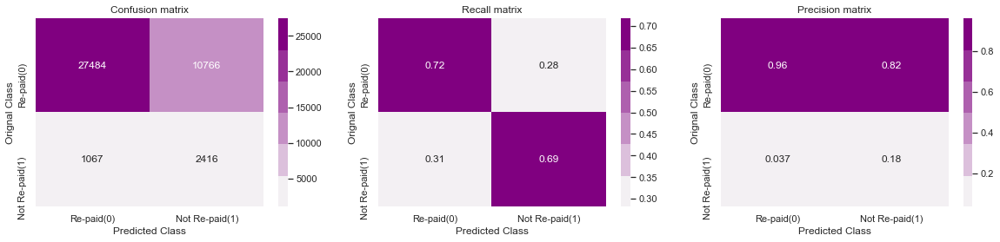

In [46]:
sns.set(font_scale = 1)
y_pred = np.ones((len(X_test),), dtype=int)
for i in range(len(y_pred_prob)):
    if y_pred_prob[i] <= 0.5:
        y_pred[i] = 0
    else:
        y_pred[i] = 1
print('The test AUC score is :', roc_auc_score(y_test, y_pred_prob))
print('The percentage of misclassified points {:05.2f}% :'.format(
    (1-accuracy_score(y_test, y_pred))*100))
plot_confusion_matrix(y_test, y_pred)

In [47]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.96      0.72      0.82     38250
           1       0.18      0.69      0.29      3483

    accuracy                           0.72     41733
   macro avg       0.57      0.71      0.56     41733
weighted avg       0.90      0.72      0.78     41733



### Histogramme des probabilités par classe

In [48]:
pred=pd.DataFrame({'y':y_test,'proba':y_pred_prob})

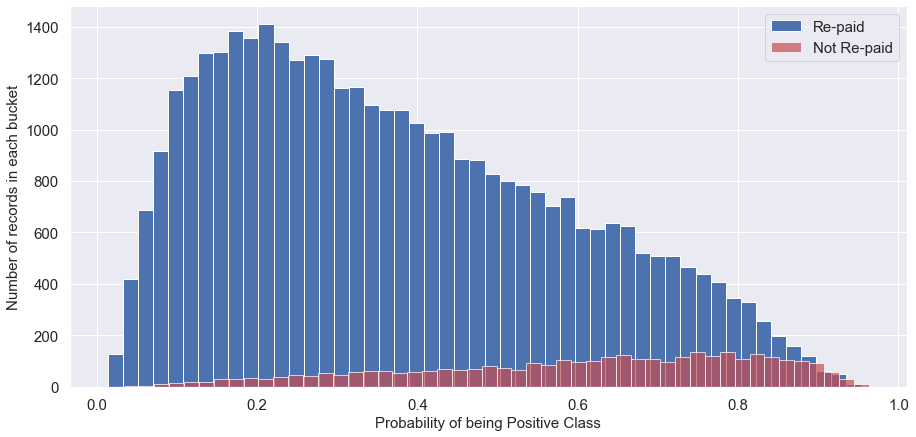

In [49]:
plt.figure(figsize=(15,7))
plt.hist(pred['proba'].loc[pred['y']==0], bins=50, label='Re-paid')
plt.hist(pred['proba'].loc[pred['y']==1], bins=50, label='Not Re-paid', alpha=0.7, color='r')
plt.xlabel('Probability of being Positive Class', fontsize=15)
plt.ylabel('Number of records in each bucket', fontsize=15)
plt.legend(fontsize=15)
plt.tick_params(axis='both', labelsize=15, pad=5)
plt.show() 

### Courbe ROC

<Figure size 432x288 with 0 Axes>

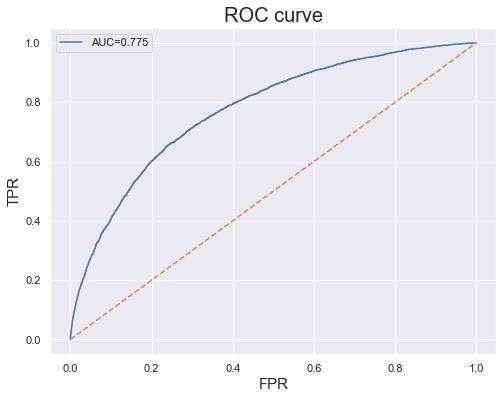

In [50]:
sns.set(font_scale = 1)
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
auc = roc_auc_score(y_test,y_pred_prob)
plt.clf()
plt.figure(figsize=(8,6))
plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], linestyle='--')
plt.title('ROC curve', fontsize = 20)
plt.xlabel('FPR', fontsize=15)
plt.ylabel('TPR', fontsize=15)
plt.legend(["AUC=%.3f"%auc])
plt.show()

### Courbe Precision-Recall

Area Under Curve: 0.27


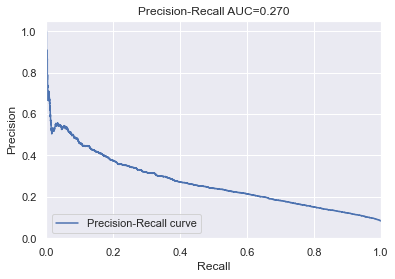

In [51]:
from sklearn import metrics

#metrics.auc(recall, precision)
# Compute Precision-Recall and plot curve
precision, recall, thresholds = precision_recall_curve(y_test, y_pred_prob)
area = metrics.auc(recall, precision)
print("Area Under Curve: %0.2f" % area)

plt.clf()
plt.plot(recall, precision, label='Precision-Recall curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall AUC=%0.3f' % area2)
plt.legend(loc="lower left")
plt.show()

In [52]:
from sklearn.metrics import average_precision_score
average_precision = average_precision_score(y_test, y_pred_prob)

print('Average precision-recall score: {0:0.2f}'.format(
      average_precision))

Average precision-recall score: 0.27


## Features importance

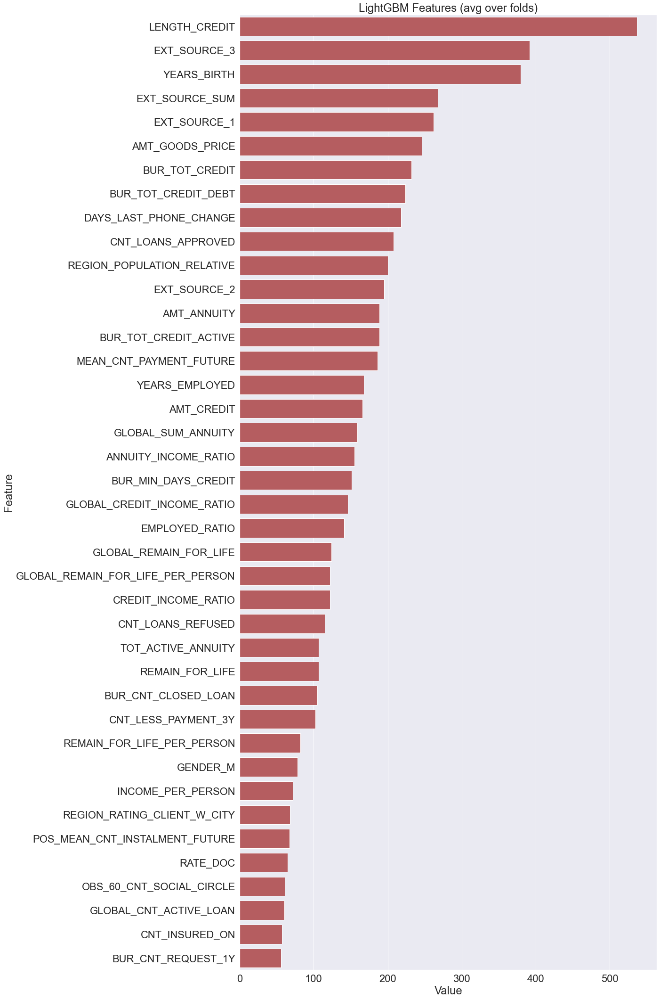

In [146]:
feature_imp= pd.DataFrame({'Value':lgbm.feature_importance(),'Feature':lgbm.feature_name()})
plt.figure(figsize=(20, 30))
sns.set(font_scale = 2)
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False)[0:40], color = 'r')
plt.title('LightGBM Features (avg over folds)')
plt.tight_layout()
#plt.savefig('lgbm_importances-01.png')
plt.show()
sns.set(font_scale = 1)

In [43]:
feature_imp2 = pd.DataFrame(sorted(zip(lgbm.feature_importance(), lgbm.feature_name())), columns=['Value','Feature'])
features_df2 = feature_imp2.sort_values(by="Value", ascending=False)
selected_features2 = list(features_df2[features_df['Value']>=0]['Feature'])
print("nombre de variables > 0: ", len(selected_features2))

nombre de variables > 0:  70


In [43]:
sns.set(font_scale = 1)

In [533]:
# Saving the final model LightGBM as pickle file for the future use in productionizing the model
with open('lgbm.pkl','wb') as fp:
    pickle.dump(lgbm, fp)

# Calcul de seuil avec le modele Lightgbm

## Calcul du meilleur seuil avec la courbe roc

Best Threshold=0.484, G-Mean=0.707


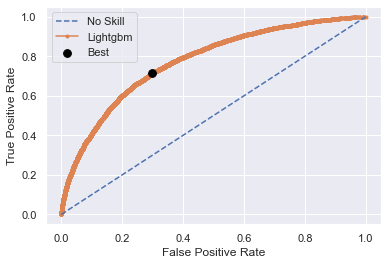

In [54]:
import math
import matplotlib.pyplot as plt

# calculate roc curves
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
# calculate the g-mean for each threshold
gmeans = np.sqrt(tpr * (1-fpr))
# locate the index of the largest g-mean
ix = np.argmax(gmeans)
print('Best Threshold=%.3f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))
# plot the roc curve for the model
plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best',s=60,zorder=2)
plt.plot(fpr, tpr, marker='.', label='Lightgbm',zorder=1)
#plt.plot(fpr, tpr, marker='.', label='lightgbm')
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
# show the plot
plt.show()

## Calcul avec la statistique J. de Youden 

In [55]:
J = tpr - fpr
ix = np.argmax(J)
best_thresh = thresholds[ix]
print('Best Threshold=%.3f' % (best_thresh))

Best Threshold=0.484


Appliccation du seuil à la matrice de confusion

The test AUC score is : 0.7745830560762922
The percentage of misclassified points 28.88% :


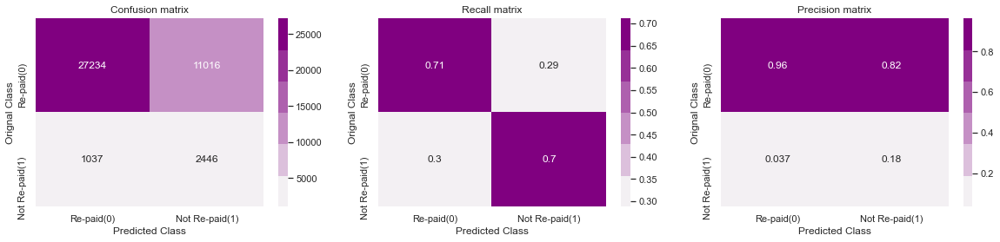

In [56]:
sns.set(font_scale = 1)
y_pred = np.ones((len(X_test),), dtype=int)
for i in range(len(y_pred_prob)):
    if y_pred_prob[i] <= 0.494:
        y_pred[i] = 0
    else:
        y_pred[i] = 1
print('The test AUC score is :', roc_auc_score(y_test, y_pred_prob))
print('The percentage of misclassified points {:05.2f}% :'.format(
    (1-accuracy_score(y_test, y_pred))*100))
plot_confusion_matrix(y_test, y_pred)

## Calcul d'un seuil de minimum de perte attendue

Estimation des pertes métier (estimation simpliste)
* perte en cas de défaut : 70%  
* perte en cas de refus : 20%  

In [57]:
threshold = []
opp_loss = []
real_loss = []
total_loss = []

loan_val = 1000000
loss_given_def = 0.7
gain_no_def = 0.2

for x in [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]:
    opp = 0
    real = 0
    total = 0

    prediction = y_pred_prob > x

    cm = confusion_matrix(y_test, prediction)

    pcm = cm/np.sum(cm)

    opp = round(pcm[0,1] * loan_val * gain_no_def,2)
    real = round(pcm[1,0] * loan_val * loss_given_def,2)
    total = opp + real
    threshold.append(x)
    opp_loss.append(opp)
    real_loss.append(real)
    total_loss.append(total)

   
credit_df = pd.DataFrame({'Threshold': threshold, 'opp_loss' : opp_loss, 'real_loss': real_loss, "total_loss": total_loss})
del threshold
del opp_loss
del real_loss
del total_loss

In [58]:
credit_df

,Threshold,opp_loss,real_loss,total_loss
0,0.0000,"183,308.1700",0.0000,"183,308.1700"
1,0.1000,"169,851.2000",436.1100,"170,287.3100"
2,0.2000,"136,793.4200","2,700.5000","139,493.9200"
3,0.3000,"103,357.0600","6,508.0400","109,865.1000"
4,0.4000,"75,082.0700","11,623.8900","86,705.9600"
5,0.5000,"51,594.6600","17,897.1100","69,491.7700"
6,0.6000,"32,348.5000","25,646.3700","57,994.8700"
7,0.7000,"17,343.5900","35,425.2000","52,768.7900"
8,0.8000,"5,947.3300","46,260.7500","52,208.0800"
9,0.9000,517.5800,"56,224.0900","56,741.6700"


0.8 minimiserait la perte, regardons graphiquement

Text(0.5, 0, 'Seuil pour la probabilité de defaut')

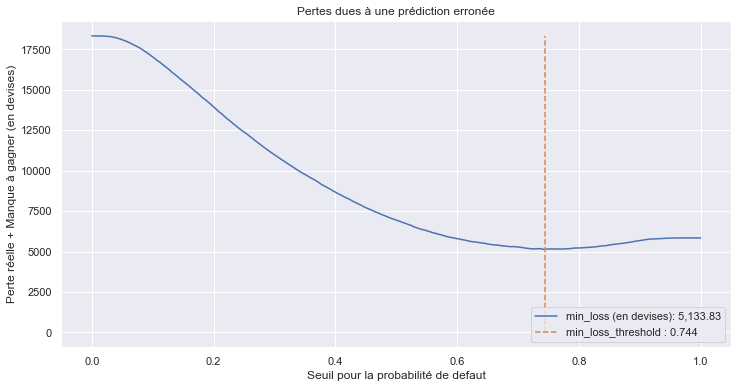

In [59]:
threshold = []
opp_loss = []
real_loss = []
total_loss = []

loan_val = 100000
loss_given_def = 0.7
gain_no_def = 0.2

for x in np.linspace(0, 1, 1000):
    opp = 0
    real = 0
    total = 0

    prediction = y_pred_prob > x

    cm = confusion_matrix(y_test, prediction)

    pcm = cm/np.sum(cm)

    opp = round(pcm[0,1] * loan_val * gain_no_def,2)
    real = round(pcm[1,0] * loan_val * loss_given_def,2)
    total = opp + real
    threshold.append(x)
    opp_loss.append(opp)
    real_loss.append(real)
    total_loss.append(total)

min_loss = round(min(total_loss),3)
imin = total_loss.index(min(total_loss))
min_loss_threshold = round(threshold[imin],3)

fig = plt.figure(figsize = (12,6))

plt.plot(threshold, total_loss, label = 'min_loss (en devises): {:,}'.format(min_loss))    

plt.plot([min_loss_threshold,min_loss_threshold],[0,max(total_loss)],
        label = 'min_loss_threshold : {:0.3}'.format(min_loss_threshold), linestyle = 'dashed')
plt.legend(loc = 'lower right')
plt.title('Pertes dues à une prédiction erronée')
plt.ylabel('Perte réelle + Manque à gagner (en devises)')
plt.xlabel('Seuil pour la probabilité de defaut')

The test AUC score is : 0.7745830560762922
The percentage of misclassified points 12.17% :


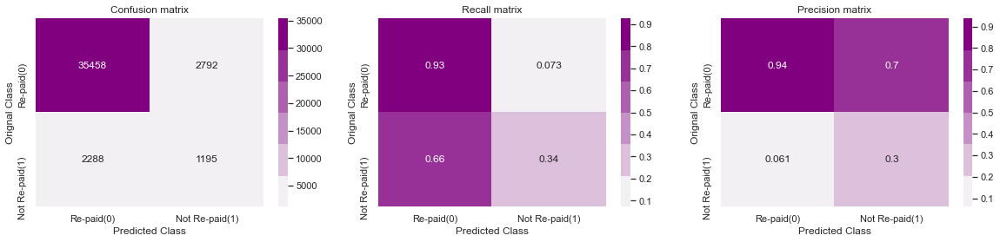

In [60]:
sns.set(font_scale = 1)
y_pred = np.ones((len(X_test),), dtype=int)
for i in range(len(y_pred_prob)):
    if y_pred_prob[i] <= 0.73:
        y_pred[i] = 0
    else:
        y_pred[i] = 1
print('The test AUC score is :', roc_auc_score(y_test, y_pred_prob))
print('The percentage of misclassified points {:05.2f}% :'.format(
    (1-accuracy_score(y_test, y_pred))*100))
plot_confusion_matrix(y_test, y_pred)

# Interpretation du modèle LightGBM

In [61]:
X = X_test.copy()
X = X.reset_index(drop=True)


## Utilisation de SHAP

In [62]:
explainer = shap.TreeExplainer(lgbm)

In [63]:
shap_values = explainer.shap_values(X[selected_features])

In [64]:
y_test_pred_prob = lgbm.predict(X[selected_features])

In [65]:
with open('DATA/shap_explainer_v2.pkl','wb') as fp:
    pickle.dump(explainer, fp)

In [66]:
with open('DATA/shap_values_v2.pkl','wb') as fp:
    pickle.dump(shap_values, fp)

### Influence sur le modèle global

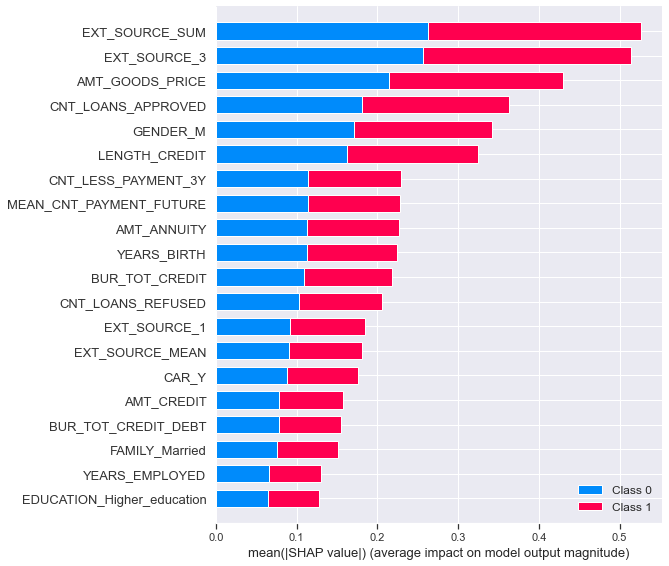

In [67]:
shap.summary_plot(shap_values, X[selected_features])

In [68]:
plt.rc('font', size=30)

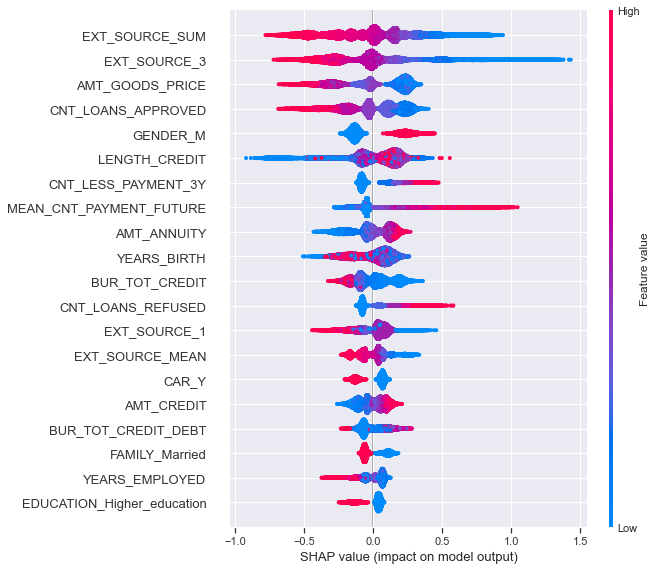

In [69]:
shap.summary_plot(shap_values[1], X[selected_features])

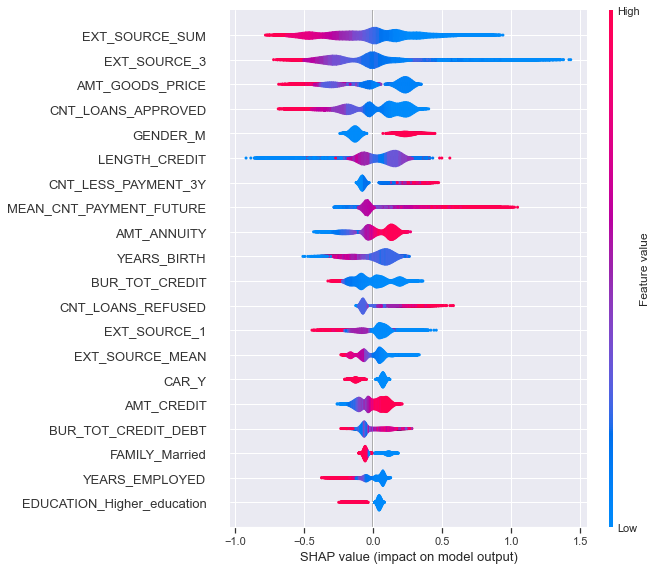

In [70]:
shap.summary_plot(shap_values[1], X[selected_features],plot_type="violin")

Enregistrement du graphique pour le tableau de bord

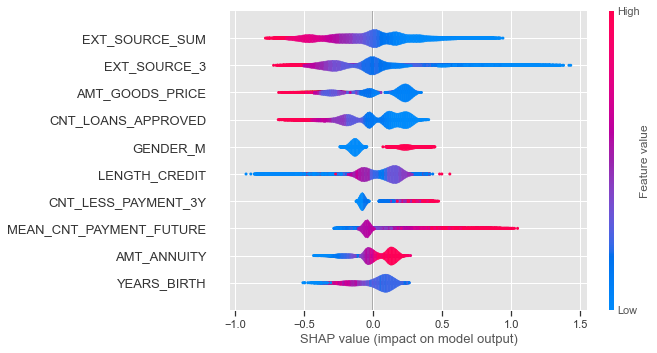

In [71]:
plt.style.use('ggplot')
shap_summary_plot = shap.summary_plot(shap_values[1], X[selected_features],plot_type="violin",
                                      show=False,max_display=10)

enregistrement pour DASH

In [72]:
with open('shap_summary_plot.pickle','wb') as fp:
    pickle.dump(shap_summary_plot, fp)

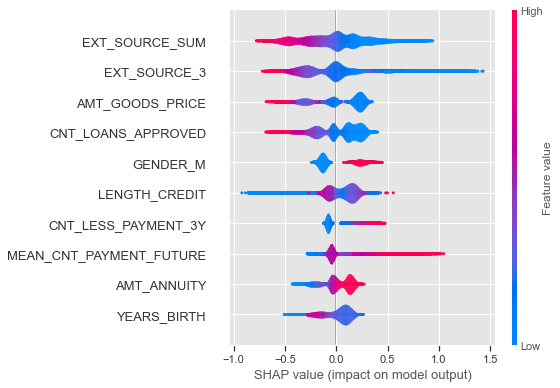

In [73]:
    plt.close('all') #pour éviter les superposition de graphiques
    shap_html =''
    shap_summary_plot = shap.summary_plot(shap_values[1], X[selected_features],plot_type="violin",
                                      show=False,max_display=10)
    #color='RdGy',
    """ figure to html base64 png image """ 
    tmpfile_sum = io.BytesIO()
    plt.tight_layout()
    plt.savefig(tmpfile_sum, format='png',facecolor='w',transparent=False,dpi=70)
    encoded_sum = base64.b64encode(tmpfile_sum.getvalue()).decode('utf-8')

In [74]:
with open('encoded_sum.pkl','wb') as fp:
    pickle.dump(encoded_sum, fp)

## Graphique d'influence pour les individus

In [85]:
y=y_test.reset_index()

Individu avec une probabilité basse à 0.33 et TARGET à 0

In [92]:
y.loc[9]

index     199879
TARGET         0
Name: 9, dtype: int64

In [76]:
y_test_pred_prob[9]

0.32662988900327955

In [75]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1][9], selected_features,link='logit')

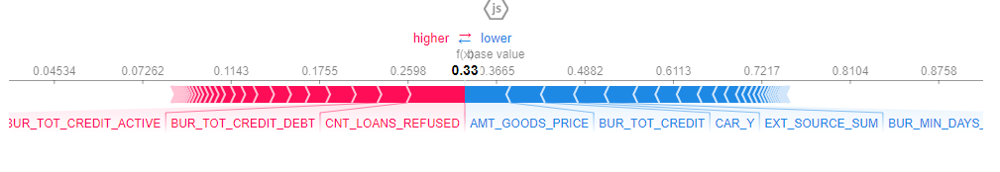![Capture-SHAP.PNG](attachment:Capture-SHAP.PNG)

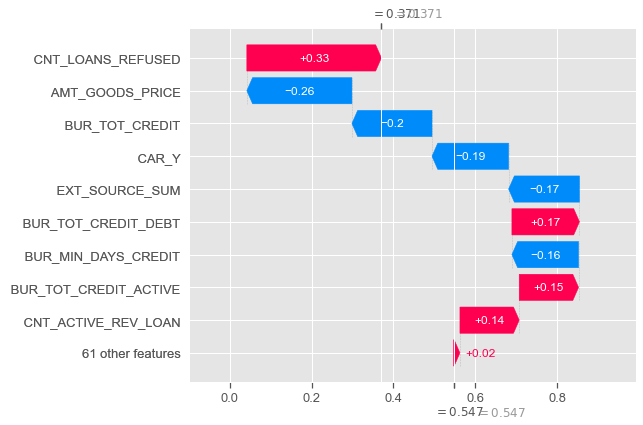

In [95]:
waterfall_plot = shap.plots._waterfall.waterfall_legacy(explainer.expected_value[0], 
                                           shap_values[1][9], features = X[selected_features].iloc[9], 
                                           feature_names = selected_features, max_display = 10, show = False)

Individu avec une probabilité haute à 0.81 et TARGET à 1

In [93]:
y.loc[26]

index     175982
TARGET         1
Name: 26, dtype: int64

In [77]:
y_test_pred_prob[26]

0.808546254462065

In [78]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1][26], selected_features,link='logit')

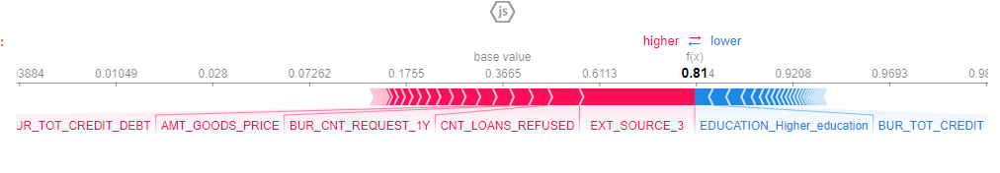

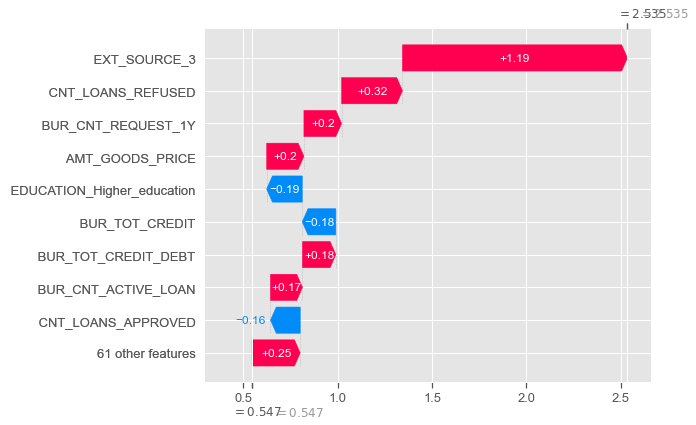

In [96]:
waterfall_plot = shap.plots._waterfall.waterfall_legacy(explainer.expected_value[0], 
                                           shap_values[1][26], features = X[selected_features].iloc[26], 
                                           feature_names = selected_features, max_display = 10, show = False)

## Interpretation avec LIME

In [97]:
import lime
import lime.lime_tabular

Lime demande un modele de prediction qui retourne deux dimensions, prediction classe 0 et prédiction classe1. Lightgbm n'en renvoie qu'une. Definition d'un fonction qui renvoie deux dimensions.

In [98]:
def prob(data):
    return np.array(list(zip(1-lgbm.predict(data),lgbm.predict(data))))

In [99]:
explainerLime = lime.lime_tabular.LimeTabularExplainer(X[selected_features].values,  
mode='classification',feature_names=lgbm.feature_name(),class_names=['Solvable','En défaut'],verbose=True)

Etude pour le 10eme individu du jeu de test

In [100]:
i = 9
exp = explainerLime.explain_instance(X[selected_features].values[i], prob, num_features=10)

Intercept 0.4346552218738844
Prediction_local [0.28550102]
Right: 0.32662988900327955


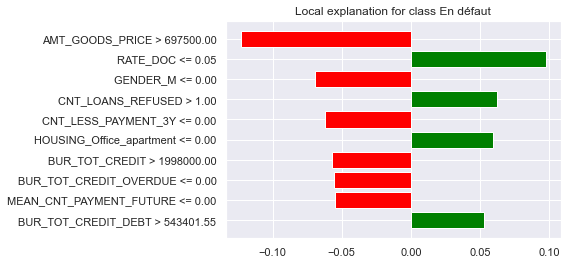

In [101]:
sns.set(font_scale = 1)
%matplotlib inline
fig = exp.as_pyplot_figure()

In [102]:

exp.show_in_notebook(show_all=True)

In [103]:
exp.show_in_notebook()

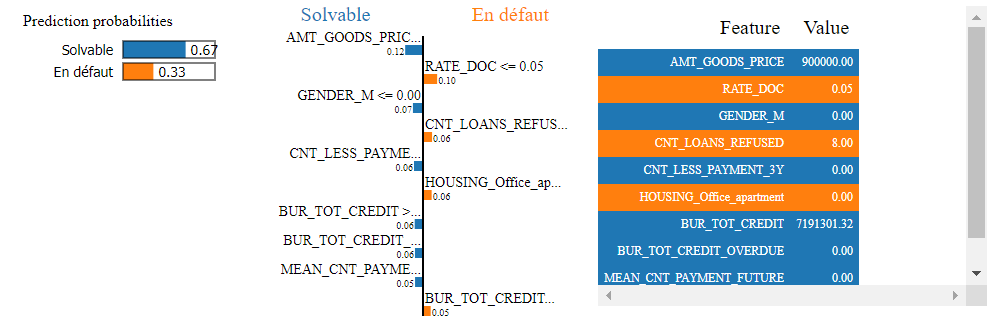

**On remarquera la difference d'interpretation entre LIME et SHAP**

exemple précédent

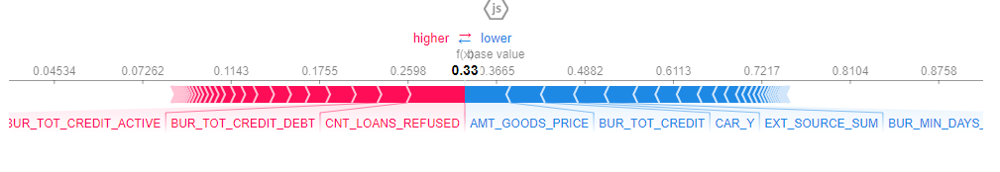![Capture-SHAP.PNG](attachment:Capture-SHAP.PNG)

## Comparaison LIME et SHAP avec une probabilité de défaut

Recherche d'une probabilité de défaut

In [104]:
y=pd.DataFrame(y_test)
y=y.reset_index()

In [105]:
y[y.TARGET == 1]

,index,TARGET
11,131713,1
13,213243,1
18,257474,1
20,193448,1
26,175982,1
...,...,...
41694,61329,1
41704,275940,1
41721,57900,1
41726,46044,1


### Interprétation LIME

In [140]:
i = 26
exp = explainerLime.explain_instance(X[selected_features].values[i], prob, num_features=10)

Intercept 0.38692312973381304
Prediction_local [0.55484241]
Right: 0.808546254462065


In [141]:
exp.show_in_notebook(show_all=True)

In [142]:
exp.show_in_notebook()

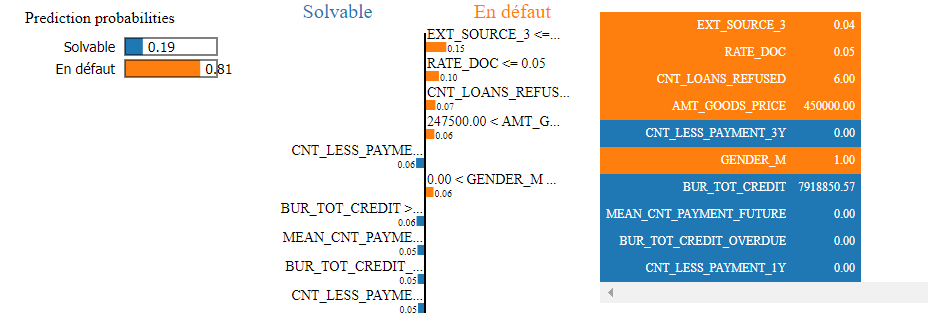

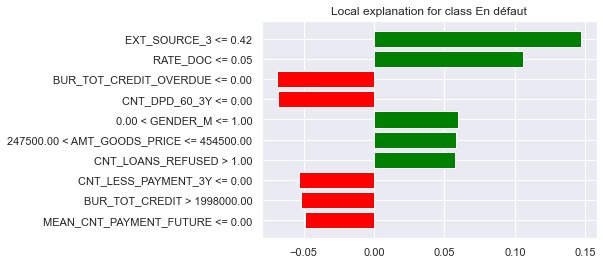

In [110]:
fig = exp.as_pyplot_figure()

### Interprétation SHAP

In [111]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1][26], selected_features,link='logit')

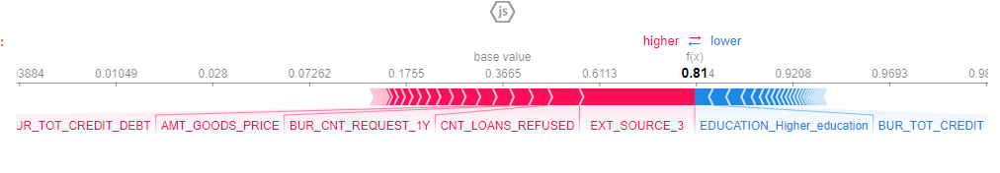![Capture-SHAP-defaut.PNG](attachment:Capture-SHAP-defaut.PNG)

# Préparation d'un jeu de données pour le tableau de bord

Reprenons le principe du jeux de test pour construire le fichier utilisé par DASH. Il aura besoin de toutes les variables et d'un index propre.

In [112]:
y = data['TARGET']
train, temp, ytrain, ytemp = train_test_split(data, y, stratify = y, test_size=0.3, random_state=42)
val, test, yval, ytest = train_test_split(temp, temp, stratify = y_temp, test_size=0.5, random_state=42)
print('Shape of train:',train.shape)
print('Shape of val:',val.shape)
print('Shape of test:',test.shape)

Shape of train: (194753, 102)
Shape of val: (41733, 102)
Shape of test: (41733, 102)


In [113]:
test

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_GOODS_PRICE,AMT_ANNUITY,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,CNT_FAM_MEMBERS,REGION_POPULATION_RELATIVE,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,EXT_SOURCE_SUM,EXT_SOURCE_MEAN,LENGTH_CREDIT,INCOME_PER_PERSON,REMAIN_FOR_LIFE,REMAIN_FOR_LIFE_PER_PERSON,CREDIT_INCOME_RATIO,ANNUITY_INCOME_RATIO,YEARS_EMPLOYED,YEARS_BIRTH,EMPLOYED_RATIO,DEF_OBS_30,DEF_OBS_60,RATE_DOC,BUR_TOT_CREDIT,BUR_TOT_CREDIT_DEBT,BUR_TOT_CREDIT_OVERDUE,BUR_TOT_CREDIT_PROLONG,BUR_TOT_ANNUITY,BUR_MIN_DAYS_CREDIT,BUR_MAX_DAYS_OVERDUE,BUR_CNT_ACTIVE_LOAN,BUR_CNT_CLOSED_LOAN,BUR_TOT_ANNUITY_ACTIVE,BUR_TOT_CREDIT_ACTIVE,BUR_CNT_REQUEST_1Y,BUR_BAL_DPD_BAD_1Y,BUR_BAL_DPD_BAD_3Y,CNT_INSURED_ON,CNT_LOANS_APPROVED,CNT_LOANS_CANCELED,CNT_LOANS_REFUSED,CNT_ACTIVE_LOAN,CNT_ACTIVE_REV_LOAN,CNT_ACTIVE_CONS_LOAN,CNT_ACTIVE_CASH_LOAN,TOT_ACTIVE_ANNUITY,MEAN_CNT_PAYMENT_FUTURE,CNT_DPD_60_1Y,CNT_DPD_60_3Y,CNT_LESS_PAYMENT_1Y,CNT_LESS_PAYMENT_3Y,POS_CNT_DPD_60_1Y,POS_CNT_DPD_60_3Y,POS_MEAN_CNT_INSTALMENT_FUTURE,CARD_CNT_DPD_60_1Y,GLOBAL_CNT_DPD_60_1Y,GLOBAL_CNT_DPD_60_3Y,GLOBAL_SUM_ANNUITY,GLOBAL_CREDIT_INCOME_RATIO,GLOBAL_REMAIN_FOR_LIFE,GLOBAL_REMAIN_FOR_LIFE_PER_PERSON,GLOBAL_CNT_ACTIVE_LOAN,EDUCATION_Higher_education,EDUCATION_Incomplete_higher,EDUCATION_Lower_secondary,EDUCATION_Secondary___secondary_special,REALTY_Y,CAR_Y,INCOME_Commercial_associate,INCOME_Pensioner,INCOME_State_servant,INCOME_Working,INCOME_Pensioner_other,FAMILY_Civil_marriage,FAMILY_Married,FAMILY_Separated,FAMILY_Single___not_married,FAMILY_Widow,HOUSING_Co-op_apartment,HOUSING_House___apartment,HOUSING_Municipal_apartment,HOUSING_Office_apartment,HOUSING_Rented_apartment,HOUSING_With_parents,GENDER_M
125450,260746,0,F,N,N,0,"112,500.0000","808,650.0000","675,000.0000","26,217.0000",Working,Secondary / secondary special,Single / not married,Municipal apartment,1.0000,0.0092,2,2,0.5076,0.7328,0.3556,0.0000,0.0000,0.0000,0.0000,"-1,775.0000",1.9733,0.6578,30.8445,"112,500.0000","86,283.0000","86,283.0000",7.1880,0.2330,0.7781,30.9589,0.0251,0.0000,0.0000,0.0500,"311,673.6000","137,502.0000",0.0000,0.0000,0.0000,"-2,663.0000",0.0000,3.0000,1.0000,0.0000,"279,360.0000",1.0000,0.0000,0.0000,2.0000,5.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,"22,500.0000",0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,"48,717.0000",0.4330,"63,783.0000","63,783.0000",4.0000,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0
33661,143098,0,F,N,Y,0,"112,500.0000","1,133,748.0000","990,000.0000","33,147.0000",Working,Incomplete higher,Civil marriage,House / apartment,2.0000,0.0105,3,3,0.3418,0.4902,0.5371,1.0000,0.0000,1.0000,0.0000,0.0000,1.3221,0.4407,34.2036,"56,250.0000","79,353.0000","39,676.5000",10.0778,0.2946,0.6027,22.8740,0.0264,0.0000,0.0000,0.0500,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,2.0000,0.0000,0.0000,1.0000,0.0000,1.0000,0.0000,"11,270.6100",58.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,"44,417.6100",0.3948,"68,082.3900","34,041.1950",1.0000,0,1,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0
178961,329221,0,F,Y,Y,0,"103,500.0000","900,000.0000","900,000.0000","38,263.5000",Pensioner,Secondary / secondary special,Married,House / apartment,2.0000,0.0188,2,2,0.5076,0.6355,0.5371,6.0000,1.0000,6.0000,1.0000,-787.0000,1.7787,0.5929,23.5211,"51,750.0000","65,236.5000","32,618.2500",8.6957,0.3697,-0.0000,56.4575,-0.0000,0.1667,0.1667,0.0500,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,3.0000,0.0000,0.0000,1.0000,0.0000,1.0000,0.0000,"3,409.2450",447.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,15.0000,0.0000,0.0000,0.0000,"41,672.74

In [114]:
df_client = test.copy()

Réinitialisation des index pour accéder facilement aux probabilités et aux shap_values et creation d'un colonne index car j'ai du mal à manipuler les index des dataframe sous SHAP

In [115]:
df_client = df_client.reset_index(drop=True)
df_client = df_client.reset_index()

In [116]:
df_client

,index,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_GOODS_PRICE,AMT_ANNUITY,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,CNT_FAM_MEMBERS,REGION_POPULATION_RELATIVE,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,EXT_SOURCE_SUM,EXT_SOURCE_MEAN,LENGTH_CREDIT,INCOME_PER_PERSON,REMAIN_FOR_LIFE,REMAIN_FOR_LIFE_PER_PERSON,CREDIT_INCOME_RATIO,ANNUITY_INCOME_RATIO,YEARS_EMPLOYED,YEARS_BIRTH,EMPLOYED_RATIO,DEF_OBS_30,DEF_OBS_60,RATE_DOC,BUR_TOT_CREDIT,BUR_TOT_CREDIT_DEBT,BUR_TOT_CREDIT_OVERDUE,BUR_TOT_CREDIT_PROLONG,BUR_TOT_ANNUITY,BUR_MIN_DAYS_CREDIT,BUR_MAX_DAYS_OVERDUE,BUR_CNT_ACTIVE_LOAN,BUR_CNT_CLOSED_LOAN,BUR_TOT_ANNUITY_ACTIVE,BUR_TOT_CREDIT_ACTIVE,BUR_CNT_REQUEST_1Y,BUR_BAL_DPD_BAD_1Y,BUR_BAL_DPD_BAD_3Y,CNT_INSURED_ON,CNT_LOANS_APPROVED,CNT_LOANS_CANCELED,CNT_LOANS_REFUSED,CNT_ACTIVE_LOAN,CNT_ACTIVE_REV_LOAN,CNT_ACTIVE_CONS_LOAN,CNT_ACTIVE_CASH_LOAN,TOT_ACTIVE_ANNUITY,MEAN_CNT_PAYMENT_FUTURE,CNT_DPD_60_1Y,CNT_DPD_60_3Y,CNT_LESS_PAYMENT_1Y,CNT_LESS_PAYMENT_3Y,POS_CNT_DPD_60_1Y,POS_CNT_DPD_60_3Y,POS_MEAN_CNT_INSTALMENT_FUTURE,CARD_CNT_DPD_60_1Y,GLOBAL_CNT_DPD_60_1Y,GLOBAL_CNT_DPD_60_3Y,GLOBAL_SUM_ANNUITY,GLOBAL_CREDIT_INCOME_RATIO,GLOBAL_REMAIN_FOR_LIFE,GLOBAL_REMAIN_FOR_LIFE_PER_PERSON,GLOBAL_CNT_ACTIVE_LOAN,EDUCATION_Higher_education,EDUCATION_Incomplete_higher,EDUCATION_Lower_secondary,EDUCATION_Secondary___secondary_special,REALTY_Y,CAR_Y,INCOME_Commercial_associate,INCOME_Pensioner,INCOME_State_servant,INCOME_Working,INCOME_Pensioner_other,FAMILY_Civil_marriage,FAMILY_Married,FAMILY_Separated,FAMILY_Single___not_married,FAMILY_Widow,HOUSING_Co-op_apartment,HOUSING_House___apartment,HOUSING_Municipal_apartment,HOUSING_Office_apartment,HOUSING_Rented_apartment,HOUSING_With_parents,GENDER_M
0,0,260746,0,F,N,N,0,"112,500.0000","808,650.0000","675,000.0000","26,217.0000",Working,Secondary / secondary special,Single / not married,Municipal apartment,1.0000,0.0092,2,2,0.5076,0.7328,0.3556,0.0000,0.0000,0.0000,0.0000,"-1,775.0000",1.9733,0.6578,30.8445,"112,500.0000","86,283.0000","86,283.0000",7.1880,0.2330,0.7781,30.9589,0.0251,0.0000,0.0000,0.0500,"311,673.6000","137,502.0000",0.0000,0.0000,0.0000,"-2,663.0000",0.0000,3.0000,1.0000,0.0000,"279,360.0000",1.0000,0.0000,0.0000,2.0000,5.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,"22,500.0000",0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,"48,717.0000",0.4330,"63,783.0000","63,783.0000",4.0000,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0
1,1,143098,0,F,N,Y,0,"112,500.0000","1,133,748.0000","990,000.0000","33,147.0000",Working,Incomplete higher,Civil marriage,House / apartment,2.0000,0.0105,3,3,0.3418,0.4902,0.5371,1.0000,0.0000,1.0000,0.0000,0.0000,1.3221,0.4407,34.2036,"56,250.0000","79,353.0000","39,676.5000",10.0778,0.2946,0.6027,22.8740,0.0264,0.0000,0.0000,0.0500,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,2.0000,0.0000,0.0000,1.0000,0.0000,1.0000,0.0000,"11,270.6100",58.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,"44,417.6100",0.3948,"68,082.3900","34,041.1950",1.0000,0,1,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0
2,2,329221,0,F,Y,Y,0,"103,500.0000","900,000.0000","900,000.0000","38,263.5000",Pensioner,Secondary / secondary special,Married,House / apartment,2.0000,0.0188,2,2,0.5076,0.6355,0.5371,6.0000,1.0000,6.0000,1.0000,-787.0000,1.7787,0.5929,23.5211,"51,750.0000","65,236.5000","32,618.2500",8.6957,0.3697,-0.0000,56.4575,-0.0000,0.1667,0.1667,0.0500,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,3.0000,0.0000,0.0000,1.0000,0.0000,1.0000,0.0000,"3,409.2450",447.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,15.0000,0.0000,0.0000,0.0000,"41,672.7450

In [117]:
with open('DATA/df_client_dash.pkl','wb') as fp:
    pickle.dump(df_client, fp)

In [118]:
with open('DATA/df_client_dash_original.pkl','wb') as fp:
    pickle.dump(test, fp)